# Voyager Images: a simocorbo side project
<div align="center">
<img src="resources/goldenrecord.jpg" width=500 >
</div>

Voyager Images is a project aimed at decoding the images stored as a stereo audio track

The clock reference is the fundamental transition of the hydrogen atom, which is $1.42GHz=7.042\cdot 10^{-10}s$
In the top left circle there is the representation of the disk, along with the stylus.
The number: $\texttt{1001 1000 0110 0100 0000 0000 0000 0000 0}_2=5113380864_{10}$
When multiplied by the unit reference, one obtains $3.6\ s$ which is the period of one rotation of the disk

The upper right image has a binary number below the waves:
$\texttt{1011 0100 1100 0000 0000 0000}_2=11845632_{10}$

After converting it to seconds one obtains $8.3417 ms$ which is the time of the scan, starting from the peaks.

The numbers above the 2nd square from the top represent how the images are encoded and it means that each image is composed by 512 columns, so each image gets mapped onto $512\times 8.3417ms=4.27s$

From the analysis of the spectrogram it can be seen where the images start and end

In [432]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
from PIL import Image

In [433]:
# load the audio file
sample_rate, audio_data = scipy.io.wavfile.read('resources/voyager_images_double.wav')
print(f"Sample rate: {sample_rate}")

left_channel = audio_data[:, 0]
right_channel = audio_data[:, 1]

Sample rate: 44100


In [434]:
# compute the spectrogram for the left channel
frequencies, times, Sxx = scipy.signal.spectrogram(left_channel, sample_rate)

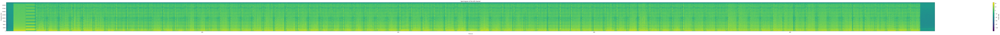

In [435]:
# plot the spectrogram
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram of the left channel')
plt.colorbar(label='Power [dB]')
# set the size of the plot
plt.gcf().set_size_inches(200, 5)
plt.show()

The images are both in the left and right audio channel, starting from the left one, the spectrogram of the first 30 second is:

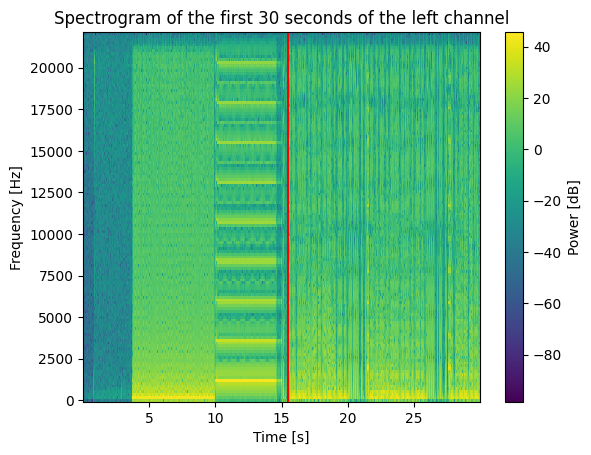

In [436]:
# extract the first 30 seconds of the left channel
audio_data_30s = left_channel[:30 * sample_rate]
# generate the spectrogram for the first 30 seconds
frequencies_30s, times_30s, Sxx_30s = scipy.signal.spectrogram(audio_data_30s, sample_rate)
# plot the spectrogram
plt.pcolormesh(times_30s, frequencies_30s, 10 * np.log10(Sxx_30s))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram of the first 30 seconds of the left channel')
plt.colorbar(label='Power [dB]')
# add a vertical line at 15.45 seconds
plt.axvline(x=15.45, color='r')
plt.show()

It is clear that the image starts at 15.45 seconds, so we can extract the peaks and we can start decoding from the last peak

Length of the audio data: 681345


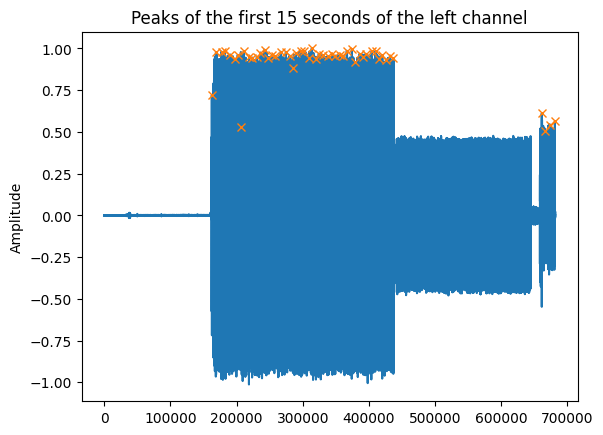

In [437]:
# extract the first 15.45 seconds of the left channel
audio_data_15s = left_channel[:round(15.45 * sample_rate)]
print(f"Length of the audio data: {len(audio_data_15s)}")

# normalise the audio data
audio_data_15s = audio_data_15s / np.max(audio_data_15s)

# compute the peaks of the signal
peaks,_ = scipy.signal.find_peaks(audio_data_15s, height=np.max(audio_data_15s)*0.5, distance=sample_rate//10)

# plot the peaks
plt.plot(audio_data_15s)
plt.plot(peaks, audio_data_15s[peaks], 'x')
plt.ylabel('Amplitude')
plt.xlabel
plt.title('Peaks of the first 15 seconds of the left channel')
plt.show()

Each image is separated by a series of peaks in the audio signals, in particular it can be clearly seen in the spectrogram of the audio between 10 and 15 seconds.

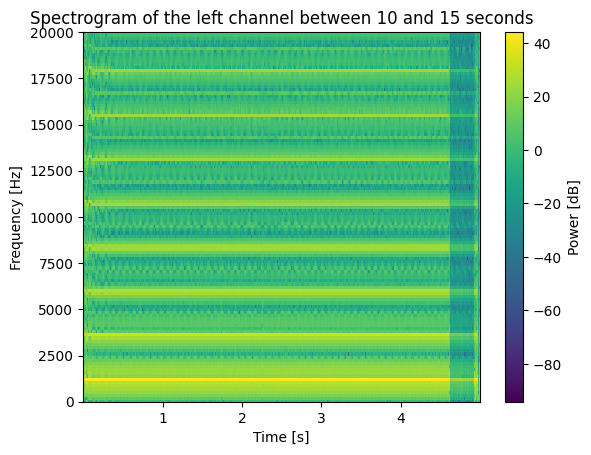

In [438]:
# spectrogram between 10 and 15 seconds
audio_data_5s= left_channel[10 * sample_rate:15 * sample_rate]

frequencies_5s, times_5s, Sxx_5s = scipy.signal.spectrogram(audio_data_5s, sample_rate)
plt.pcolormesh(times_5s, frequencies_5s, 10 * np.log10(Sxx_5s))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.ylim(0, 20000)
plt.title('Spectrogram of the left channel between 10 and 15 seconds')
plt.colorbar(label='Power [dB]')
plt.show()



Now, we can trim the audio from the last peak of the first 15 seconds to the end

In [439]:
left_channel=left_channel[peaks[-1]:]

To isolate the images, the image delimiters are identified

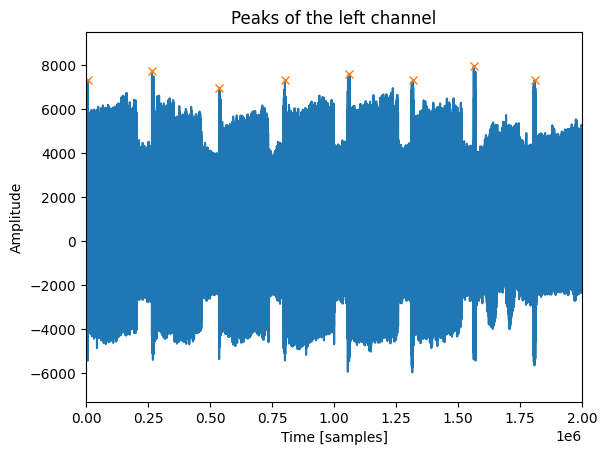

In [440]:
# the images are separated by a series of peaks in the audio signal
# find the peaks
imgs, _ = scipy.signal.find_peaks(left_channel, height=np.max(left_channel)*0.79, distance=sample_rate*5)
# plot the peaks
plt.plot(left_channel)
plt.plot(imgs, left_channel[imgs], 'x')
plt.ylabel('Amplitude')
plt.xlabel('Time [samples]')
# x limit to the first images
plt.xlim(0, 2000000)
# set the size of the plot
#plt.gcf().set_size_inches(200, 5)
plt.title('Peaks of the left channel')
plt.show()

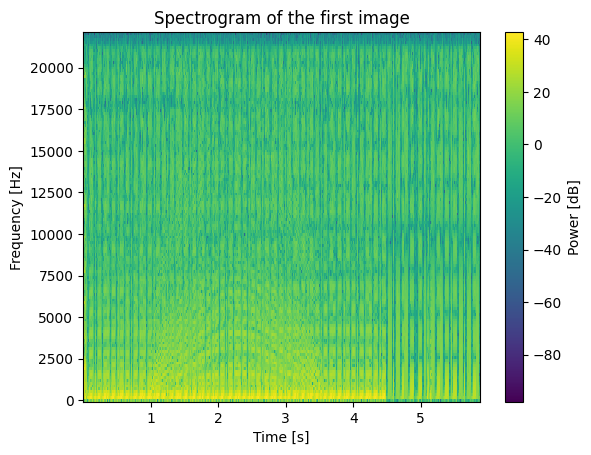

In [441]:
# plot the spectrogram of the first image
frequencies_img, times_img, Sxx_img = scipy.signal.spectrogram(left_channel[imgs[0]:imgs[1]], sample_rate)
plt.pcolormesh(times_img, frequencies_img, 10 * np.log10(Sxx_img))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram of the first image')
plt.colorbar(label='Power [dB]')
plt.show()

The fitness of this algorithm can be seen by plotting all the spectrograms

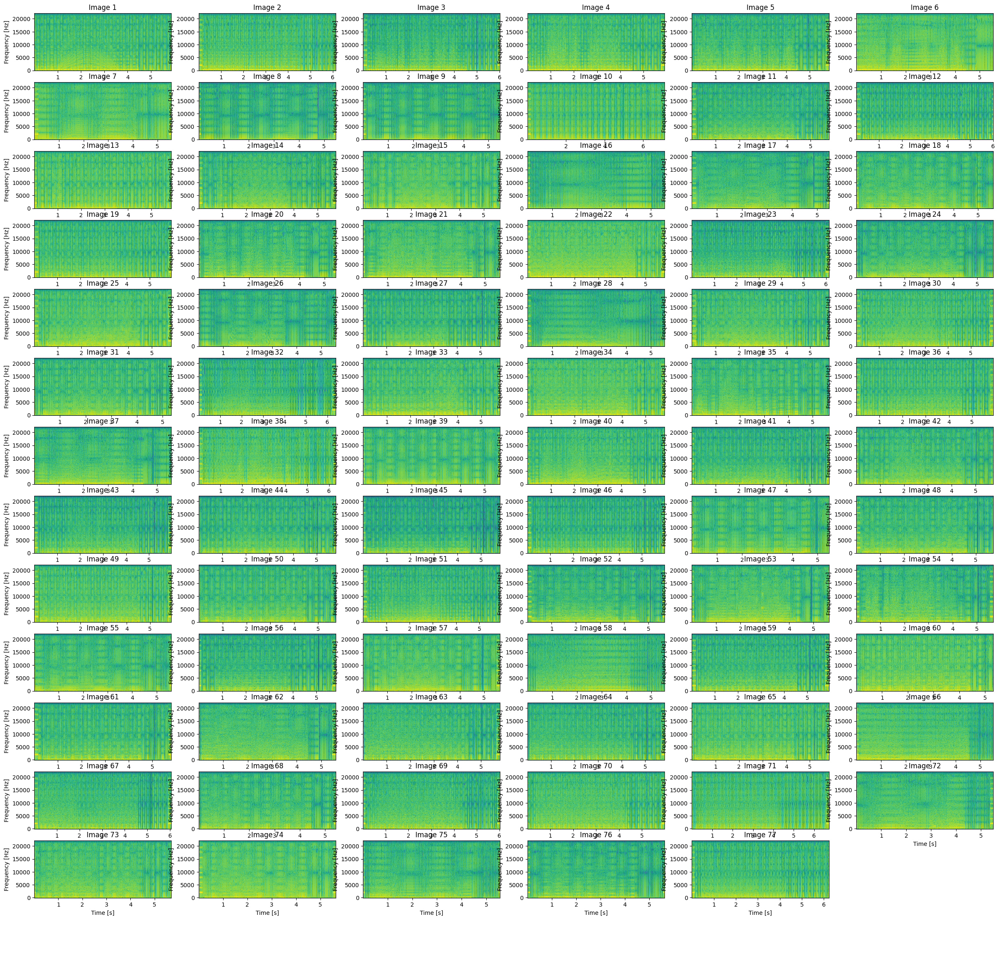

In [442]:
# plot the spectrograms of all the images in a grid of 5 columns
n_cols = 6
n_rows = len(imgs) // n_cols + 1
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for i, ax in enumerate(axs.flat):
    if i < len(imgs)-1:
        f, t, Sxx = scipy.signal.spectrogram(left_channel[imgs[i]:imgs[i+1]], sample_rate)
        ax.pcolormesh(t, f, 10 * np.log10(Sxx))
        ax.set_title(f'Image {i+1}')
        ax.set_ylabel('Frequency [Hz]')
        ax.set_xlabel('Time [s]')
        ax.set_aspect('auto')
    else:
        ax.axis('off')

# First Image
Now we can extract the first image and we can visualise it.

In the Voyager Golden record it can be seen below the indication of the number of columns and it can be used to calibrate the algorithm.
It should display a black circle on a white background
## Fine trimming
The algorithm shown before leaves a margin, both before and after the image, so it needs to be removed

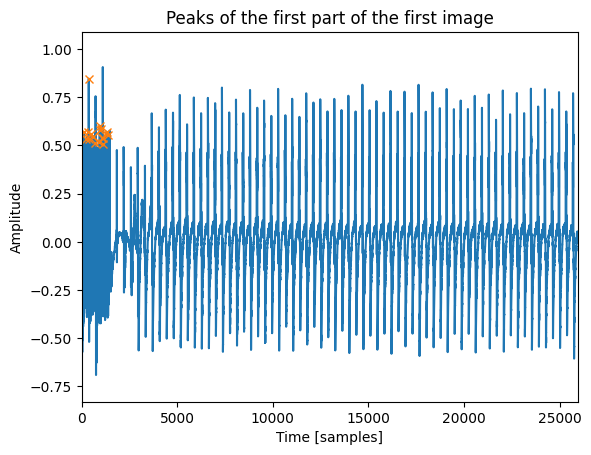

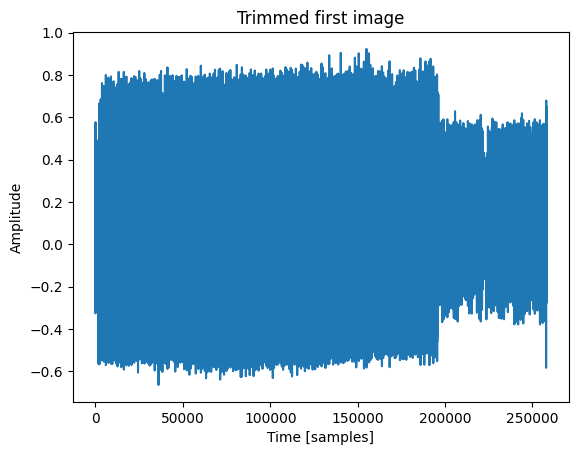

In [443]:
img=left_channel[imgs[0]:imgs[1]]


# normalise the image
img = img / np.max(img)

# to find the effective length of the image, we need to trim the eventual image delimiters at the beginning and at the end
# find the peaks in the first part of the image, to trim the beginning
startPeaks, _ = scipy.signal.find_peaks(img[:len(img)//10], height=np.max(img)*0.5, threshold=0.2)
# plot the peaks
plt.plot(img)
plt.plot(startPeaks, img[startPeaks], 'x')
plt.ylabel('Amplitude')
plt.xlabel('Time [samples]')
plt.xlim(0, len(img)//10)
plt.title('Peaks of the first part of the first image')
plt.show()

# trim the beginning of the image
img = img[startPeaks[-1]:]
#plot the trimmed image
plt.plot(img)
plt.ylabel('Amplitude')
plt.xlabel('Time [samples]')
plt.title('Trimmed first image')
plt.show()



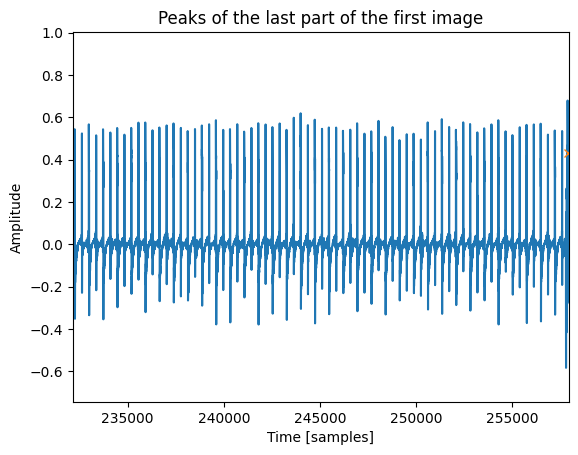

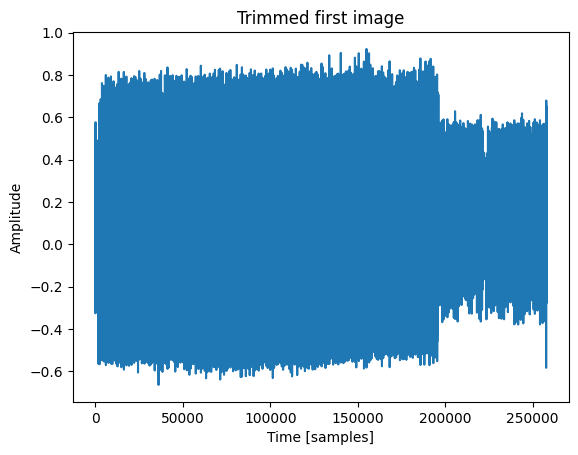

In [444]:
# now we need to trim the end of the image
# find the peaks in the last part of the image
endPeaks, _ = scipy.signal.find_peaks(img[-len(img)//10:], height=np.max(img)*0.5, threshold=0.2)
# plot the peaks
plt.plot(img)
plt.plot(endPeaks+img.size-len(img)//10, img[endPeaks+img.size-len(img)//10], 'x')
plt.ylabel('Amplitude')
plt.xlabel('Time [samples]')
plt.xlim(img.size-len(img)//10, img.size)
plt.title('Peaks of the last part of the first image')
plt.show()

# trim the end of the image
img = img[:endPeaks[0]+img.size-len(img)//10]
#plot the trimmed image
plt.plot(img)
plt.ylabel('Amplitude')
plt.xlabel('Time [samples]')
plt.title('Trimmed first image')
plt.show()



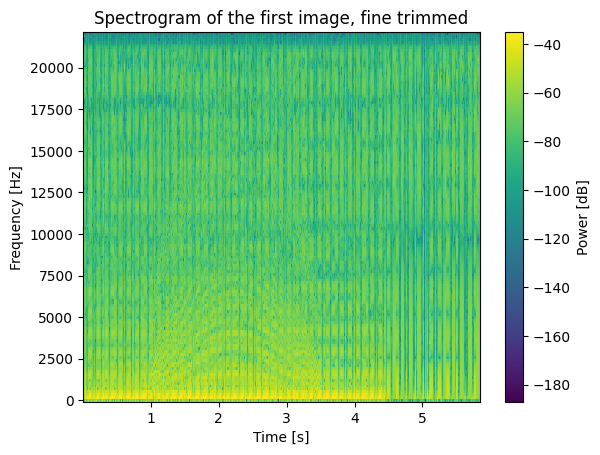

In [445]:
# plot the spectrogram of the first image
frequencies_img, times_img, Sxx_img = scipy.signal.spectrogram(img, sample_rate)
plt.pcolormesh(times_img, frequencies_img, 10 * np.log10(Sxx_img))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram of the first image, fine trimmed')
plt.colorbar(label='Power [dB]')
plt.show()


## Function Definition
There is the function to fine trim an image:

In [446]:
def fineTrim(channel, start, end):
    image=channel[start:end]

    # normalise the image
    image = image / np.max(image)

    # to find the effective length of the image, we need to trim the eventual image delimiters at the beginning and at the end

    # find the peaks in the first part of the image, to trim the beginning
    peaks, _ = scipy.signal.find_peaks(image[:len(image)//10], height=np.max(image)*0.5, threshold=0.2)
    # trim the beginning of the image
    if len(peaks) > 0:
        image = image[peaks[-1]:]

    # now we need to trim the end of the image
    # find the peaks in the last part of the image
    peaks, _ = scipy.signal.find_peaks(image[-len(image)//10:], height=np.max(image)*0.5, threshold=0.2)
    # trim the end of the image
    if len(peaks) > 0:
        image = image[:peaks[0]+image.size-len(image)//10]
    
    return image

## Columns detection
Each column is delimited by peaks, which can be easily recognised

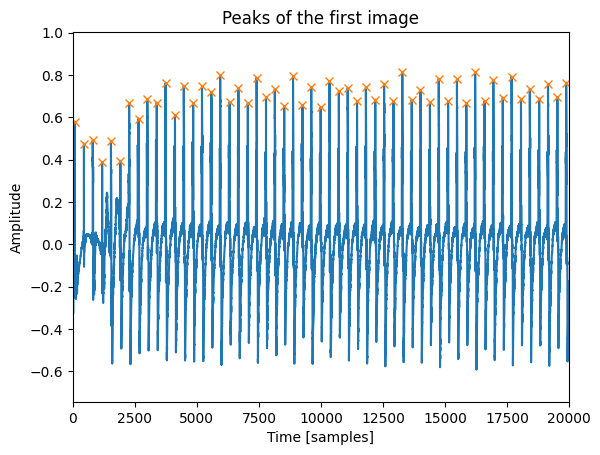

In [447]:
# now we can find the column delimiters as the peaks the trimmed image
colPeaks, _ = scipy.signal.find_peaks(img, distance=sample_rate/200)
# plot the peaks
plt.plot(img)
plt.plot(colPeaks, img[colPeaks], 'x')
plt.ylabel('Amplitude')
plt.xlabel('Time [samples]')
plt.title('Peaks of the first image')
plt.xlim(0, 20000)
plt.show()


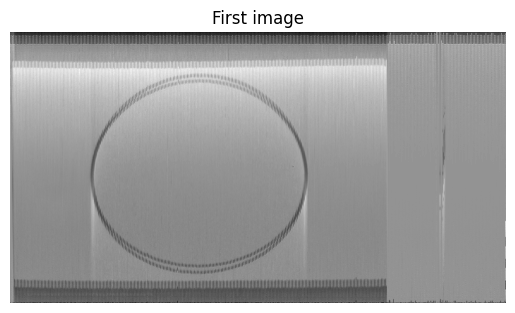

In [448]:
# each peak is a column delimiter, we can now extract the columns and plot them in a canvas
cols = []
# the height of the column is based on the proportion of the image
width=512
# ratio between the width and the height of the image is 4:3
height=round(width*3/4)
# extract the columns
for i in range(len(colPeaks)-1):
    # extract the column
    col = img[colPeaks[i]:colPeaks[i+1]]
    # an higher value of the column corresponds to a black pixel, so we need to invert the column
    col = 1-col

    # the column is resized to the height of the image
    col = scipy.signal.resample(col, height)
    # append the column to the rows
    cols.append(col)

# transpose the columns to have the image in the right orientation
decoded_img = np.array(cols).T
# plot the image
plt.imshow(decoded_img, cmap='gray')
plt.axis('off')
plt.title('First image')
plt.show()

## Jitter Problem
We can see that the trace of the circle is not clear.
The main reason can be seen by plotting 3 consecutive rows:

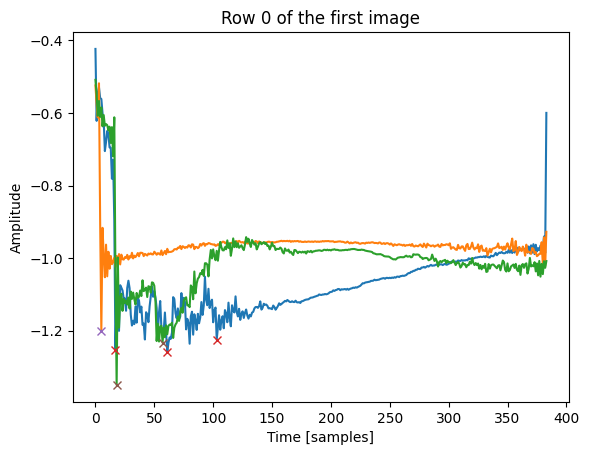

First difference: 0.10065645514223204
Second difference: -0.015454048140044363


In [449]:
# plot row 256
row_number = 0
plt.plot(-cols[row_number])
plt.plot(-cols[row_number+1])
plt.plot(-cols[row_number+2])

plt.ylabel('Amplitude')
plt.xlabel('Time [samples]')
plt.title('Row '+str(row_number)+' of the first image')

# plot the first dip
dip_i=scipy.signal.find_peaks(cols[row_number], prominence=0.15, threshold=-1)
dip_i1=scipy.signal.find_peaks(cols[row_number+1], prominence=0.15, threshold=-1)
dip_i2=scipy.signal.find_peaks(cols[row_number+2], prominence=0.15, threshold=-1)
plt.plot(dip_i[0], -cols[row_number][dip_i[0]], 'x')
plt.plot(dip_i1[0], -cols[row_number+1][dip_i1[0]], 'x')
plt.plot(dip_i2[0], -cols[row_number+2][dip_i2[0]], 'x')
plt.show()

# compute the difference between i and i+1
diff = cols[row_number+1][0]-cols[row_number][0]
print(f"First difference: {diff}")

# compute the difference between i+1 and i+2
diff = cols[row_number+2][0]-cols[row_number+1][0]
print(f"Second difference: {diff}")


The orange track is misaligned with respect to the previous and the following column, but is aligned almost perfectly with two column after.
This problem is recurring for every image.
We can see it by plotting the distance (in samples) between the last peak of column $i$ and $i+1$

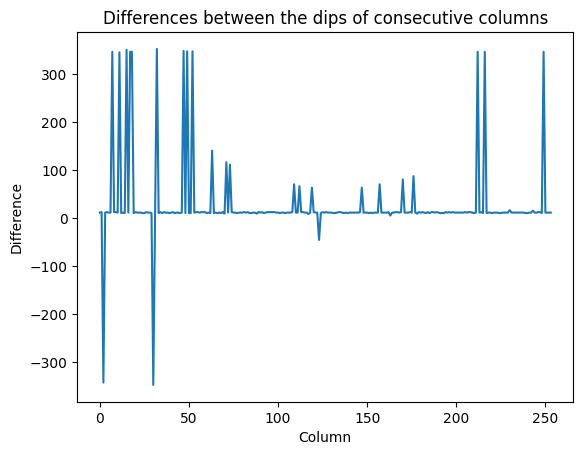

Average: 28


In [450]:
# we can compute the difference between the dips of column i and column i+1
diffs = []
for i in range(0, width-1, 2):
    dip_i = scipy.signal.find_peaks(-cols[i], prominence=0.15, threshold=-1)
    dip_i1 = scipy.signal.find_peaks(-cols[i+1], prominence=0.15, threshold=-1)
    if len(dip_i[0]) > 0 and len(dip_i1[0]) > 0:
        diffs.append(dip_i[0][0]-dip_i1[0][0])

# plot the differences
plt.plot(diffs)
plt.ylabel('Difference')
plt.xlabel('Column')
plt.title('Differences between the dips of consecutive columns')
plt.show()
# average
avg = round(np.mean(diffs))
print(f"Average: {avg}")

By splitting the Average Difference of the calibration image, a more accurate image can be produced.
In particular we get half of the average by trimming the beginning of the column with an even index and by repeating the last sample for the number of times specified by the offset on the odd columns

In [451]:
offset=avg//2
print(f"Offset: {offset}")
# in practice a value of 12 makes a better result, i don't know why, but it works

Offset: 14


But, the alternating pattern depends on the sign of the difference, so a function that returns the direction can be helpful

In [452]:
def offsetDirection(peaks, width):
    cols = []
    for i in range(len(peaks)-1):
        col = img[peaks[i]:peaks[i+1]]
        col = 1-col
        col = scipy.signal.resample(col, height)
        cols.append(col)
    
    


    diffs = []
    for i in range(0, width-1, 2):
        dip_i = scipy.signal.find_peaks(-cols[i], prominence=0.15, threshold=-1)
        dip_i1 = scipy.signal.find_peaks(-cols[i+1], prominence=0.15, threshold=-1)
        if len(dip_i[0]) > 0 and len(dip_i1[0]) > 0:
            diffs.append(dip_i[0][0]-dip_i1[0][0])

    onEven = True
    if np.mean(diffs) < 0:
        onEven = False

    #print(f"Average: {round(np.mean(diffs))}")
        
    return onEven

Therefore we can subtract the average difference and obtain the following:

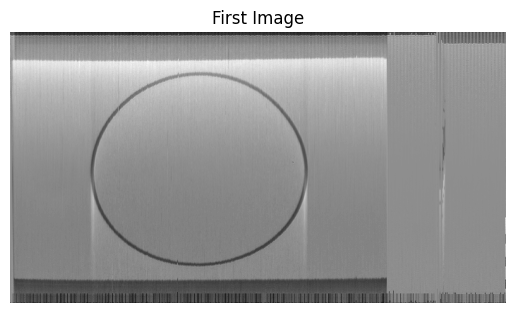

In [453]:
cols = []

# the height of the column is based on the proportion of the image
width=512
# ratio between the width and the height of the image is 4:3
height=round(width*3/4)
# extract the columns
peaks,_ = scipy.signal.find_peaks(img, distance=sample_rate/200)

onEven = offsetDirection(peaks, width)

offset=12



# extract the columns
for i in range(len(peaks)-1):
    # extract the column
    col = img[peaks[i]:peaks[i+1]]
    # an higher value of the column corresponds to a black pixel, so we need to invert the column
    col = 1-col

    
    
    # on even columns, remove the first 10 samples and add 10 duplicates of the last sample
    
    direction = 0 if onEven else 1
    if i%2==direction:
        col = col[offset:]
    else:
        col = np.concatenate([col, np.full(offset, col[-1])])

    col = scipy.signal.resample(col, height)
    # append the column to the rows
    cols.append(col)

# transpose the columns to have the image in the right orientation
decoded_img = np.array(cols).T
# plot the image
plt.imshow(decoded_img, cmap='gray')
plt.axis('off')
plt.title('First Image')
plt.show()


## Another Version
By implementing another idea, the results are not as great...

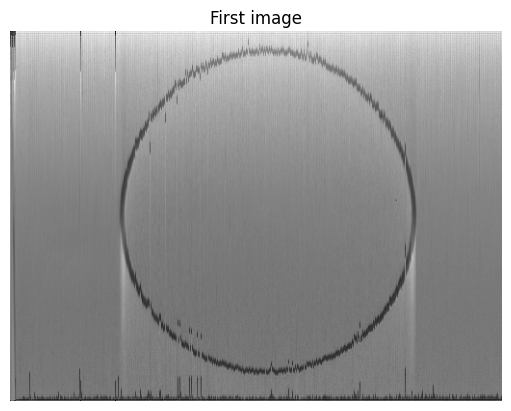

In [454]:
# now we can find the column delimiters as the peaks the trimmed image
peaks, _ = scipy.signal.find_peaks(img, distance=sample_rate/200)
# each peak is a column delimiter, we can now extract the columns and plot them in a canvas
cols = []
# the height of the column is based on the proportion of the image
width=512
# ratio between the width and the height of the image is 4:3
height=round(width*3/4)
# extract the columns
#for i in range(len(peaks)-1):
for i in range(0, width-1):
    # extract the column
    col = img[peaks[i]:peaks[i+1]]
    # an higher value of the column corresponds to a black pixel, so we need to invert the column
    col = 1-col


    # find the first dip
    col_dips, _ = scipy.signal.find_peaks(col, prominence=0.3, height=1.2)
    # find the last peak
    col_peaks, _ = scipy.signal.find_peaks(-col, prominence=0.1, height=-0.6)
    # trim the row
    if len(col_dips) > 0 and len(col_peaks) > 0 and col_dips[0] < col_peaks[-1]:
        col = col[col_dips[0]:col_peaks[-1]]
    # the column is resized to the height of the image
    col = scipy.signal.resample(col, height)
    # append the column to the rows
    cols.append(col)

# transpose the columns to have the image in the right orientation
img = np.array(cols).T
# plot the image
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('First image')
plt.show()

# Function Definitions
To streamline the process, the following functions can be defined:

In [462]:
def developImage(img):
    # now we can find the column delimiters as the peaks the trimmed image
    peaks, _ = scipy.signal.find_peaks(img, distance=sample_rate/200)
    # each peak is a column delimiter, we can now extract the columns and plot them in a canvas
    cols = []
    # the height of the column is based on the proportion of the image
    width=512
    # ratio between the width and the height of the image is 4:3
    height=round(width*3/4)


    onEven = offsetDirection(peaks, width)
    # extract the columns
    for i in range(width-1):
    #for i in range(len(peaks)-1):
        # extract the column
        col = img[peaks[i]:peaks[i+1]]
        # an higher value of the column corresponds to a black pixel, so we need to invert the column
        #col = 1-col
        
        # on even columns, remove the first 10 samples and add 10 duplicates of the last sample


        direction = 0 if onEven else 1
        if i%2==direction:
            col = col[offset:]
        else:
            col = np.concatenate([col, np.full(offset, col[-1])])
              
        col = scipy.signal.resample(col, height)
        # append the column to the rows
        cols.append(col)

    # transpose the columns to have the image in the right orientation
    img = np.array(cols).T
    # Get upper and lower percentiles of image data.
    low = np.percentile(img, 2)
    high = np.percentile(img, 98)
    
    # Normalize image contrast and invert image.
    img_data = np.clip(img, low, high)
    img_data = 255 - ((img - low) / (high - low)) * 255
    # plot the image
    #plt.imshow(img, cmap='gray')
    #plt.axis('off')
    #plt.title('mage')
    #plt.show()
    return img_data

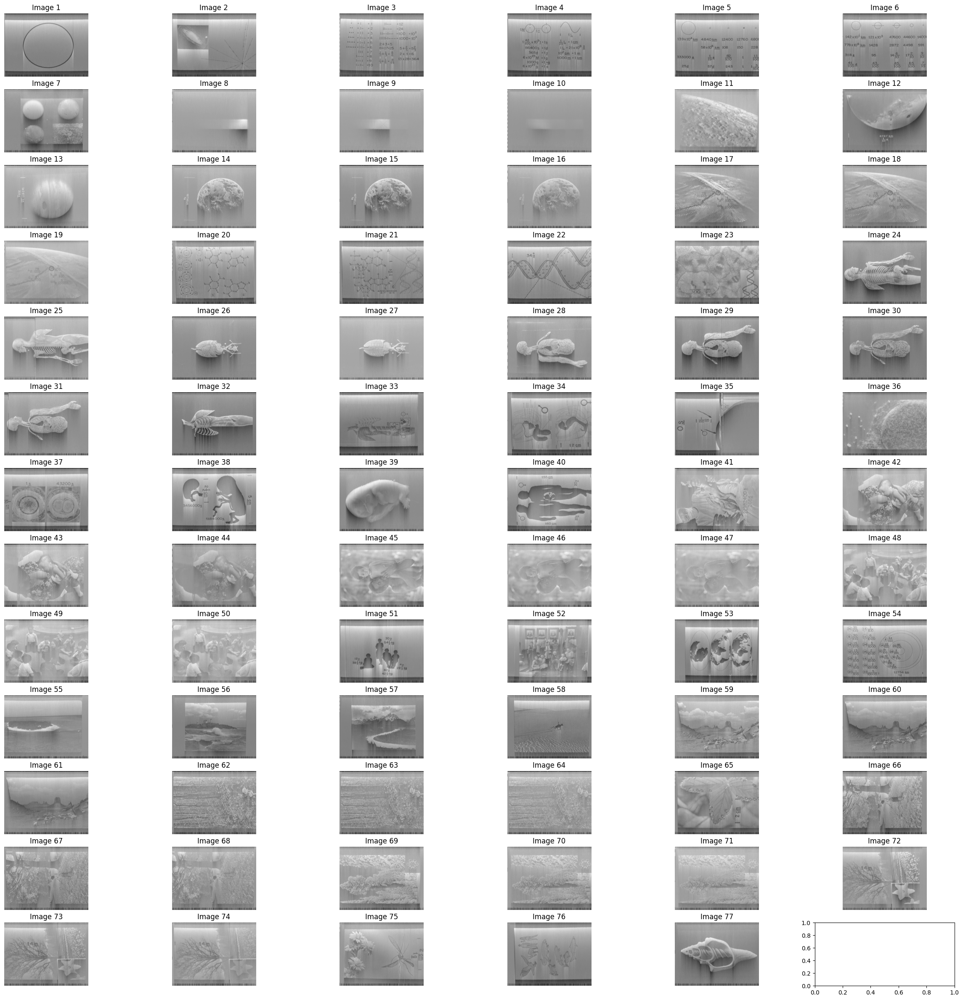

In [463]:
# we can now develop the images and put the in a grid
n_cols = 6
n_rows = len(imgs) // n_cols + 1
fig, axs = plt.subplots(n_rows-1, n_cols, figsize=(30, 30))

decoded_imgs = []


# now we can do the same for the other images
for i in range(0, len(imgs)-1):
    img = fineTrim(left_channel, imgs[i], imgs[i+1])
    img=developImage(img)
    decoded_imgs.append(img)
    axs.flat[i].imshow(img, cmap='gray')
    #print(f"Image {i+1} extracted")
    axs.flat[i].axis('off')
    axs.flat[i].set_title(f'Image {i+1}')
plt.show()

# Color images
As we can see, few images are displayed 3 times, which means that are coloured images, in RGB

In [457]:
coloured_imgs = [[14, 15, 16], [17, 18, 19], [29, 30, 31], [42, 43, 44], [45, 46, 47], [48, 49, 50], [59, 60, 61], [62, 63, 64], [66, 67, 68], [69, 70, 71], [72, 73, 74]]
black_white_imgs = [i for i in range(0, 78)]
for image in coloured_imgs:
    for i in image:
        black_white_imgs.remove(i)

The order of the colours is Red, Green, Blue

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-161.14313576403367..357.0296193367253].


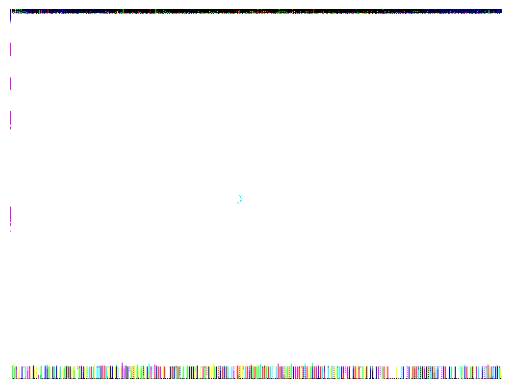

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-226.2371289217096..331.51523208676576].


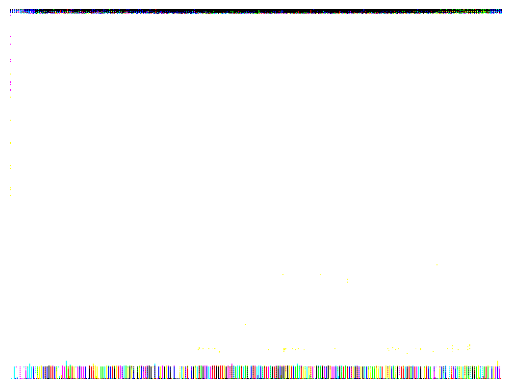

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-164.96394083537683..436.4753975464713].


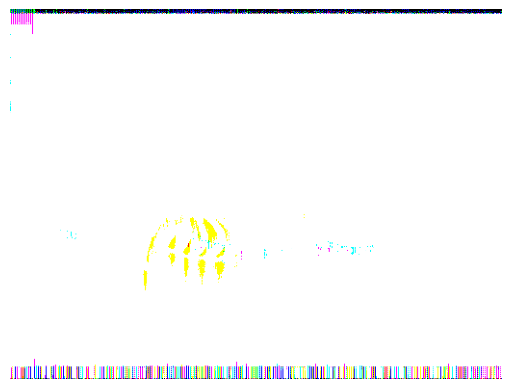

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-180.3588351524424..397.363983889225].


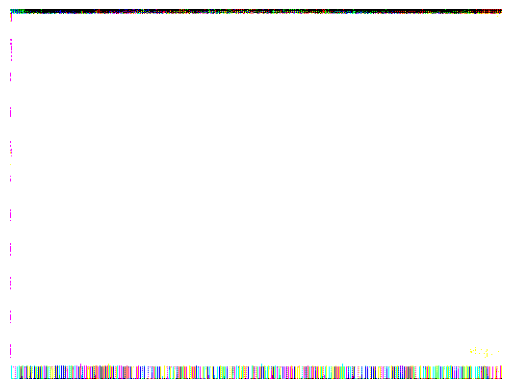

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-215.85417932763738..345.3308677789861].


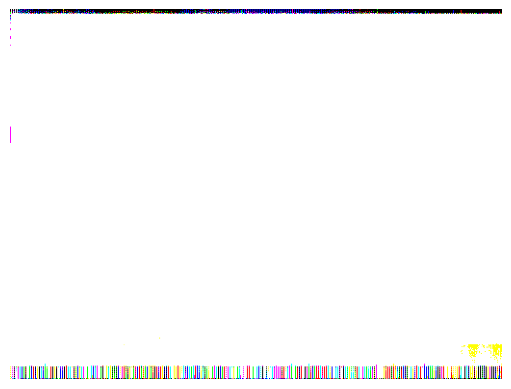

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-197.52666639259752..330.86671127906686].


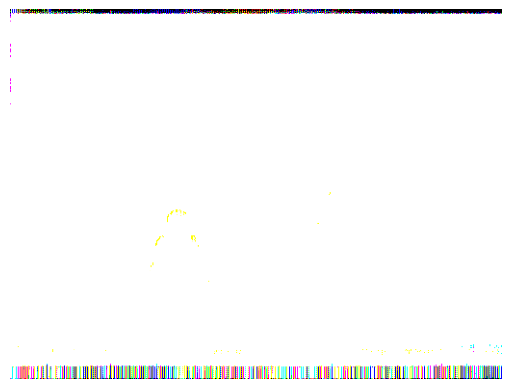

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-132.989382644636..362.45737330691725].


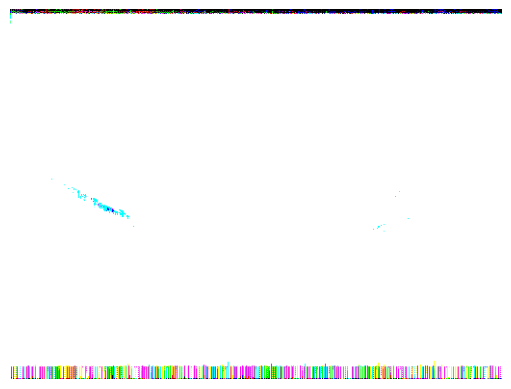

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-149.76014001913808..373.01493025523].


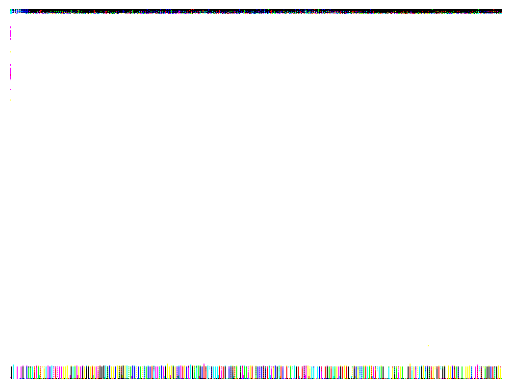

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-160.69903701068216..380.9892830315821].


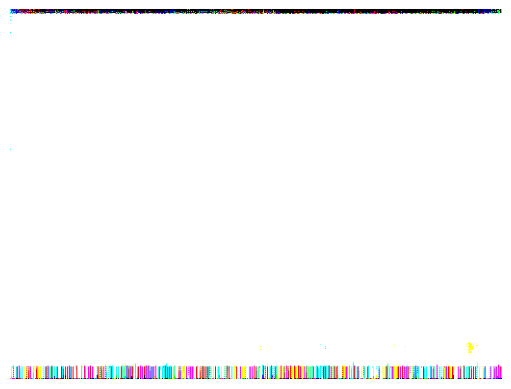

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-189.39167770392214..342.2907001764662].


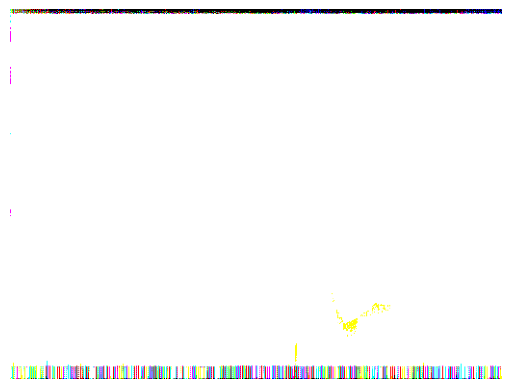

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-166.4556302757381..348.147998301979].


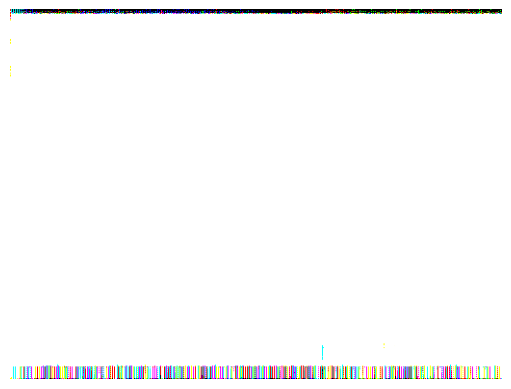

In [464]:
for colors in coloured_imgs:

    # Get RGB channels for color image.
    red = decoded_imgs[colors[0]]
    # rescale the red channel to 0, 255
    #red = (red - np.min(red)) / (np.max(red) - np.min(red)) * 255/3

    green = decoded_imgs[colors[1]]
    # rescale the green channel to 0, 255
    #green = (green - np.min(green)) / (np.max(green) - np.min(green)) * 255/3

    blue = decoded_imgs[colors[2]]
    # rescale the blue channel to 0, 255
    #blue = (blue - np.min(blue)) / (np.max(blue) - np.min(blue)) * 255/3
    
    color_img = np.dstack((red, green, blue))

    # Display the image.
    plt.imshow(color_img)

    plt.axis('off')
    plt.show()


In [465]:
for colors in coloured_imgs:

    # Get RGB channels for color image.
    r, g, b = [decoded_imgs[c] for c in colors]

    # Crop image to smallest sized channel.
    edge = min(max(r.shape), max(g.shape), max(b.shape))
    r, g, b = (r[:,:edge], g[:,:edge], b[:,:edge])

    # Combine color channels into a single image.
    color_img = np.dstack((r,g,b))

    # Gamma correct image.
    color_render = Image.fromarray(color_img.astype(np.uint8))
    color_render = color_render.point(lambda x: ((x / 255) ** 1.6) * 255)

    # Save color image file.
    color_render.save(f"color{colors[0]:03d}-{colors[-1]:03d}.png")